Tecnólogo em Inteligência Artificial







# **FIAP - Iniciação Científica - NEXT**

**Autor do Notebook: Isaac Maciel Gomez Carvalheiro**


<div align="center">
  <img src="https://drive.google.com/uc?export=view&id=1eLnvj4Wzy59TUNLK-7HtKPB4i0jFIU6M" alt="GIF Description" />
</div>


**Última atualização: 17/12/2023**

**integrantes:**




<div align="center">
  <img src="https://drive.google.com/uc?export=view&id=1F5ECFqRV-U3VhIks6IBWqNLlUKKIu9e0" width="33%" />
  <img src="https://drive.google.com/uc?export=view&id=1IzrxWNuZPkcFu_cd-yZ08IUENFTOLefA" width="33%" />
  <img src="https://drive.google.com/uc?export=view&id=10ZKP_EuUnNbw-HEey56Rhqh6VaXPLKEf" width="33%" />
</p>

<div align="center">
  <img src="https://drive.google.com/uc?export=view&id=1N2L6vMXeEXm59bGoy4mlgldVpNFI9Ski" width="33%" />
  <img src="https://drive.google.com/uc?export=view&id=1lsN38FFC06hqckf7EPHOvD6x2fJxsDiV" width="33%" />
  <img src="https://drive.google.com/uc?export=view&id=1vd2v-iWBaOYoZj_96vOsZhOgwVvbCbCg" width="33%" />
</p>


[Isaac Maciel](https://br.linkedin.com/in/isaac-maciel)


[André Godoi](https://br.linkedin.com/in/andre-godoi-chiovato-83730228?original_referer=https%3A%2F%2Fwww.google.com%2F)

[Murilo Krauss](https://br.linkedin.com/in/murilo-krauss-84a82024)

[Camilly Alves](https://br.linkedin.com/in/camilly-alves-77a04b266?original_referer=https%3A%2F%2Fwww.google.com%2F)

[Nicolas Gonçalves](https://br.linkedin.com/in/nicolas-felippe-gon%C3%A7alves-94654499)

[Caio Salesi](https://br.linkedin.com/in/caio-salesi)


# Detecção de Presença Binária Personalizada - Modelo de Treino do TensorFlow Lite no Colab

<div align="center">
  <img src="https://drive.google.com/uc?export=view&id=1igC4B6HTm_z-Yu08lKoFG5TYWcXxQ6Gz" width="43.6%" />
  <img src="https://drive.google.com/uc?export=view&id=1IO_xRcycvRXuMIcbmL18qF3mFlY3TVR4" width="53%" />
</p>
  
O modelo detecta o "Murilo", que é nossa classe principal, e "Outros", que serve como palavra-chave para nossa classe destinada a outras pessoas; ou seja, ele identifica quando é ou não o Murilo.
</div>

**Introdução**

>Este caderno utiliza a API TensorFlow 2 Object Detection para treinar um modelo SSD-MobileNet ou EfficientDet com um conjunto de dados personalizado e convertê-lo para o formato TensorFlow Lite. Ao trabalhar com este Colab, você será capaz de criar e baixar um modelo TFLite que pode ser executado no seu PC, em um telefone Android ou em um dispositivo de borda como o Raspberry Pi.








**Trabalhando no Colab**

> O Colab fornece uma máquina virtual no seu navegador completa com um sistema operacional Linux, sistema de arquivos, ambiente Python e, o melhor de tudo, uma GPU gratuita. Ele vem com a maioria dos requisitos de backend do TensorFlow (como CUDA e cuDNN) pré-instalados. Basta clicar no botão de reprodução nas seções de código neste caderno para executá-las na máquina virtual.




**Nota: Certifique-se de estar usando uma máquina equipada com GPU indo em "Runtime" -> "Alterar tipo de runtime" na barra de menu superior, e então selecionando "GPU" no dropdown de Acelerador de Hardware.**

## 1.&nbsp;Coletar e Rotular Imagens de Treinamento





>  Antes de começar o treinamento, precisamos coletar e rotular imagens que serão usadas para treinar o modelo de detecção de objetos. O processo de coleta pode ser realizado

>* Tirando fotos

>* Coledando em Clouds

>* Coletando em Plataformas Sociais

>  Um bom ponto de partida para um modelo de prova de conceito é de 500 imagens.

>  As imagens de treinamento devem ter objetos aleatórios na imagem, juntamente com os objetos desejados, e devem ter uma variedade de fundos e condições de iluminação.

<div align="center">
  <img src="https://drive.google.com/uc?export=view&id=1uLk5mOkFGE30BTMX9_StPvzizwVBMQFq" width="33%" />
  <img src="https://drive.google.com/uc?export=view&id=1ikI_O3S0yeA26lztAA0pAHvds3qT2KHC" width="33%" />
  <img src="https://drive.google.com/uc?export=view&id=1InWK7MFDJW1KeOewW-Sqp-qYbN08eZnN" width="33%" />
</p>



***HYPERLINK DE REDIRECIONAMENTO EX.***: [Construcao_de_Dataset_Hibrido_Deteccao_de_Classificacao_Binaria](https://)

## 2.&nbsp;Instalar Dependências da Detecção de Objetos TensorFlow








>  Primeiro, vamos instalar a API de Detecção de Objetos TensorFlow nesta instância do Google Colab. Isso requer clonar o [repositório de modelos do TensorFlow](https://github.com/tensorflow/models)
 e executar alguns comandos de instalação.

>  Clique no botão de reprodução para executar as seguintes seções de código.

>  A versão mais recente do TensorFlow com a qual este Colab foi verificado para funcionar é a TF v2.8.0.

In [ ]:
# Clone o repositório de modelos do TensorFlow do GitHub
!pip uninstall Cython -y # Solução temporária para o erro "Módulo 'object_detection' não encontrado"
!git clone --depth 1 https://github.com/tensorflow/models

Found existing installation: Cython 3.0.7
Uninstalling Cython-3.0.7:
  Successfully uninstalled Cython-3.0.7
Cloning into 'models'...
remote: Enumerating objects: 4065, done.
remote: Counting objects: 100% (4065/4065), done.
remote: Compressing objects: 100% (3105/3105), done.
remote: Total 4065 (delta 1184), reused 1939 (delta 900), pack-reused 0
Receiving objects: 100% (4065/4065), 54.72 MiB | 25.31 MiB/s, done.
Resolving deltas: 100% (1184/1184), done.


In [ ]:
# Copiar arquivos de configuração para a pasta models/research
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
#cp object_detection/packages/tf2/setup.py .

In [ ]:
# Modificar o arquivo setup.py para instalar o repositório tf-models-official direcionado para a versão TF v2.8.0
import re
with open('/content/models/research/object_detection/packages/tf2/setup.py') as f:
    s = f.read()

with open('/content/models/research/setup.py', 'w') as f:
    # Configurar o caminho de fine_tune_checkpoint
    s = re.sub('tf-models-official>=2.5.1',
               'tf-models-official==2.8.0', s)
    f.write(s)

In [ ]:
# Instalar a API de Detecção de Objetos
# Necessário fazer uma correção temporária com o PyYAML, pois o Colab não consegue instalar a versão 5.4.1 do PyYAML
!pip install pyyaml==5.3
!pip install /content/models/research/

# Necessário rebaixar para a versão TF v2.8.0 devido a um bug de compatibilidade do Colab com a versão TF v2.10 (até 10/03/22)
!pip install tensorflow==2.8.0

# Instale a versão 11.0 do CUDA (para manter compatibilidade com o TF v2.8.0)
!pip install tensorflow_io==0.23.1
!wget https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/cuda-ubuntu1804.pin
!mv cuda-ubuntu1804.pin /etc/apt/preferences.d/cuda-repository-pin-600
!wget http://developer.download.nvidia.com/compute/cuda/11.0.2/local_installers/cuda-repo-ubuntu1804-11-0-local_11.0.2-450.51.05-1_amd64.deb
!dpkg -i cuda-repo-ubuntu1804-11-0-local_11.0.2-450.51.05-1_amd64.deb
!apt-key add /var/cuda-repo-ubuntu1804-11-0-local/7fa2af80.pub
!apt-get update && sudo apt-get install cuda-toolkit-11-0
!export LD_LIBRARY_PATH=/usr/local/cuda-11.0/lib64:$LD_LIBRARY_PATH


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.2/268.2 kB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.3-cp310-cp310-linux_x86_64.whl size=44244 sha256=c3247ccb97caaf567801d9560999b983552f8491e131f22f534ee21928698dff
  Stored in directory: /root/.cache/pip/wheels/0d/72/68/a263cfc14175636cf26bada99f13b735be1b60a11318e08bfc
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.1
    Uninstalling PyYAML-6.0.1:
      Successfully uninstalled PyYAML-6.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
llmx 0.0.15a0 requires cohere, which is not installed.
llmx 0.0.15a0 requires openai, which is not installed.
llmx 0.0.15a0 requires tiktoken, which is not installed.
dask 2023.8.1 requires pyyaml>=5.3.1, but you have pyyaml 5.3 which is incompatible.
distr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 497.6/497.6 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.5/462.5 kB 49.1 MB/s eta 0:00:00
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.8.1
    Uninstalling tensorflow-2.8.1:
      Successfully uninstalled tensorflow-2.8.1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.1/23.1 MB 40.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 88.1 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-io-gcs-filesystem
    Found existing installation: tensorflow-io-gcs-filesystem 0.35.0
    Uninstalling tensorflow-io-gcs-filesystem-0.35.0:
      Successfully uninstalled tensorflow-io-gcs-filesystem-0.35.0
  Attempting uninstall: tensorflow_io
    Found existing installation: tensorflow-io 0.35.0
    Uninstalling tensorflow-io-0.35.0:
      Successfully uninstalled tensorflow-io-0.35.0
--2024-01-08 04:55:26--  https://developer.download.nvidia.com/compute/cuda/repos

>  Vamos testar nossa instalação executando model_builder_tf2_test.py para garantir que tudo esteja funcionando conforme o esperado.

>  Execute o seguinte bloco de código e confirme que ele termina sem erros.

>  Se você encontrar erros, tente pesquisá-los no Google ou verificar a documentação do TensorFlow

In [ ]:
# Executar o arquivo de teste do Construtor de Modelo, apenas para verificar se tudo está funcionando corretamente
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

Running tests under Python 3.10.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2024-01-08 04:59:25.494413: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0108 04:59:25.996892 136006782771200 model_builder.py:1112] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 4.11s
I0108 04:59:26.983099 136006782771200 test_util.py:2373] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 4.11s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 2.38s
I0108 04:59:29.365477 136006782771200 tes

## 3.&nbsp;Carregar Conjunto de Dados de Imagem e Preparar Dados de Treinamento







>  Nesta seção, vamos fazer o upload dos nossos dados e prepará-los para treinamento com o TensorFlow.

>  Faremos o upload das nossas imagens, dividiremos em pastas de treino, validação e teste, e em seguida executaremos scripts para criar TFRecords a partir dos nossos dados.

>  Primeiro, no seu PC local, compacte todas as suas imagens de treinamento e arquivos XML em uma única pasta chamada "images.zip".

>  Os arquivos devem estar diretamente dentro da pasta zip, ou em uma pasta aninhada conforme mostrado abaixo:

```
images.zip
-- images
  -- img1.jpg
  -- img1.xml
  -- img2.jpg
  -- img2.xml
  ...
```

### 3.1 Fazer upload das imagens

> Existem três opções para transferir os arquivos de imagem para esta instância do Colab.

>> **Opção 1. Fazer upload através do Google Colab**




>>> Faça o upload do arquivo "images.zip" para a instância do Google Colab clicando no ícone "Arquivos" no lado esquerdo do navegador, e depois no ícone "Enviar para o armazenamento da sessão". Selecione a pasta zip para fazer o upload.







![](https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/doc/colab_upload_button.png)

>> **Opção 2. Copiar do Google Drive**

>>> Você também pode fazer o upload das suas imagens para o seu Google Drive pessoal, montar o drive nesta sessão do Colab e copiá-las para o sistema de arquivos do Colab.

>>> Esta opção é útil se você quiser fazer o upload das imagens antecipadamente para não ter que esperar por eles toda vez que reiniciar este Colab.

>>> Se você tiver mais de 50MB em imagens, recomendo usar esta opção.

>>> Primeiro, faça o upload do arquivo "images.zip" para o seu Google Drive e anote a pasta para a qual você fez o upload.

>>> Substitua `MyDrive/caminho/para/images.zip` pelo caminho do seu arquivo zip. (Por exemplo, se eu fizer o upload do arquivo zip para uma pasta chamada "Deteccao_de_Classificacao_Binaria", eu usaria `MyDrive/Deteccao_de_Classificacao_Binaria/images.zip` para o caminho).


>>> Em seguida, execute o seguinte bloco de código para montar seu Google Drive nesta sessão do Colab e copiar a pasta para este sistema de arquivos.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

!cp /content/gdrive/MyDrive/caminho/para/images.zip /content # Substituir com o seu caminho

>> **Opção 3. Usar conjunto de dados de Detecção Binária**

>>> Se você não tem um conjunto de dados e apenas quer tentar treinar um modelo, você pode baixar meu conjunto de dados de imagens de Detecção Binária para usar como exemplo.

>>> Eu fiz o upload de um conjunto de dados contendo 1000 imagens rotuladas de um participante do projeto, `Murilo`, e imagens de pessoas geradas por IA, respeitando as diretrizes da LGPD, com a classe classificada como `Outros`.

>>>Execute o bloco de código a seguir para baixar o conjunto de dados.

In [ ]:
# !gdown --id 1SV8v6i9TkmI2qiAyQ-SMgGK87N_9FH36 -O /content/images.zip ## EM BREVE :)

### 3.2 Dividir imagens em pastas de treino, validação e teste

> Neste ponto, seja você tendo usado a `Opção 1, 2 ou 3`, você deve ser capaz de clicar no ícone de pasta à esquerda e ver o seu arquivo "images.zip" na lista de arquivos.

> Agora que o conjunto de dados foi carregado, vamos descompactá-lo e criar algumas pastas para armazenar as imagens. Estes diretórios são criados na pasta /content no sistema de arquivos desta instância.

> Você pode navegar pelo sistema de arquivos clicando no ícone "Arquivos" à esquerda.

In [ ]:
!mkdir /content/images
!unzip -q images.zip -d /content/images/all
!mkdir /content/images/train; mkdir /content/images/validation; mkdir /content/images/test

> A seguir, dividiremos as imagens nos conjuntos de treino, validação e teste. Aqui está o que cada conjunto é usado para:

> * **Treino:** Estas são as imagens reais usadas para treinar o modelo. Em cada etapa do treinamento, um lote de imagens do conjunto "treino" é passado para a rede neural.

>>> A rede prevê as classes e localizações dos objetos nas imagens. O algoritmo de treinamento calcula a perda (ou seja, o quão "erradas" foram as previsões) e ajusta os pesos da rede através da retropropagação.

> * **Validação:** Imagens do conjunto de "validação" podem ser usadas pelo algoritmo de treinamento para verificar o progresso do treinamento e ajustar hiperparâmetros (como taxa de aprendizagem).

>>> Ao contrário das imagens de "treino", essas imagens são usadas apenas periodicamente durante o treinamento (ou seja, uma vez a cada certo número de etapas de treinamento).

> * **Teste:** Estas imagens nunca são vistas pela rede neural durante o treinamento. Elas são destinadas a ser usadas por um humano para realizar testes finais do modelo para verificar quão preciso é o modelo.




> Evan Juras escreveu um script Python para mover aleatoriamente 80% das imagens para a pasta "treino", 10% para a pasta "validação" e 10% para a pasta "teste".

> Clique em executar no seguinte bloco para baixar o script e executá-lo.

In [ ]:
!wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/train_val_test_split.py
!python train_val_test_split.py

--2024-01-08 05:01:40--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/train_val_test_split.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2803 (2.7K) [text/plain]
Saving to: ‘train_val_test_split.py’

train_val_test_spli 100%[===================>]   2.74K  --.-KB/s    in 0s      

2024-01-08 05:01:40 (27.4 MB/s) - ‘train_val_test_split.py’ saved [2803/2803]

Total images: 1000
Images moving to train: 800
Images moving to validation: 100
Images moving to test: 100


### 3.3 Criar Labelmap e TFRecords


> Finalmente, precisamos criar um labelmap para o detector e converter as imagens em um formato de arquivo de dados chamado TFRecords, que são usados pelo TensorFlow para treinamento.

> Usaremos scripts Python para converter automaticamente os dados no formato TFRecord. Antes de executá-los, precisamos definir um labelmap para nossas classes.



> A seção de código abaixo criará um arquivo "labelmap.txt" que contém uma lista de classes.

> Substitua o texto class1, class2 pelas suas próprias classes (por exemplo, `Murilo` & `Outros`), adicionando uma nova linha para cada classe.

> Em seguida, clique em executar para executar o código.







In [ ]:
# Criando um arquivo "labelmap.txt" com uma lista de classes que o modelo de detecção de objetos irá detectar
%%bash
cat <<EOF >> /content/labelmap.txt
Murilo
Outros
EOF

> Baixe e execute os scripts de conversão de dados do [repositório do GitHub](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi) clicando em executar nas três próximas seções de código.

> Eles criarão arquivos TFRecord para os conjuntos de dados de treino e validação, bem como um arquivo labelmap.pbtxt que contém o labelmap em um formato diferente.

In [ ]:
# Baixar scripts de conversão de dados
! wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_csv.py
! wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_tfrecord.py

--2024-01-08 05:01:49--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_csv.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1348 (1.3K) [text/plain]
Saving to: ‘create_csv.py’

create_csv.py       100%[===================>]   1.32K  --.-KB/s    in 0s      

2024-01-08 05:01:49 (82.8 MB/s) - ‘create_csv.py’ saved [1348/1348]

--2024-01-08 05:01:49--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_tfrecord.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githu

In [ ]:
# Criar arquivos de dados CSV e arquivos TFRecord
!python3 create_csv.py
!python3 create_tfrecord.py --csv_input=images/train_labels.csv --labelmap=labelmap.txt --image_dir=images/train --output_path=train.tfrecord
!python3 create_tfrecord.py --csv_input=images/validation_labels.csv --labelmap=labelmap.txt --image_dir=images/validation --output_path=val.tfrecord

Successfully converted xml to csv.
Successfully converted xml to csv.
Successfully created the TFRecords: /content/train.tfrecord
Successfully created the TFRecords: /content/val.tfrecord


> Vamos armazenar os locais dos arquivos TFRecord e labelmap como variáveis para que possamos referenciá-los mais tarde nesta sessão do Colab.

In [ ]:
train_record_fname = '/content/train.tfrecord'
val_record_fname = '/content/val.tfrecord'
label_map_pbtxt_fname = '/content/labelmap.pbtxt'

## 4.&nbsp;Configurar Configuração de Treinamento

> Nesta seção, configuraremos o modelo e a configuração de treinamento. Especificaremos qual modelo pré-treinado do TensorFlow queremos usar do [TensorFlow 2 Object Detection Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md).

> Cada modelo também vem com um arquivo de configuração que aponta para locais de arquivos, define parâmetros de treinamento (como taxa de aprendizado e número total de etapas de treinamento) e mais.

> Modificaremos o arquivo de configuração para nosso trabalho de treinamento personalizado.

> A primeira seção do código lista alguns modelos disponíveis no Zoo de Modelos TF2 e define alguns nomes de arquivos que serão usados mais tarde para baixar o modelo e o arquivo de configuração.

> Isso facilita o gerenciamento de qual modelo você está usando e adicionar outros modelos à lista mais tarde.

> Defina a variável "chosen_model" para corresponder ao nome do modelo com o qual você gostaria de treinar. Atualmente, está configurado para usar o popular modelo "ssd-mobilenet-v2".

> Clique em reproduzir no próximo bloco assim que o modelo escolhido for definido.

In [ ]:
# Altere a variável chosen_model para implantar diferentes modelos disponíveis no zoo de detecção de objetos TF2
chosen_model = 'ssd-mobilenet-v2-fpnlite-320'

MODELS_CONFIG = {
    'ssd-mobilenet-v2': {
        'model_name': 'ssd_mobilenet_v2_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz',
    },
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
    },
    'ssd-mobilenet-v2-fpnlite-320': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz',
    },
        # O modelo centernet não está funcionando a partir de 10/09/22
    #'centernet-mobilenet-v2': {
    #    'nome_modelo': 'centernet_mobilenetv2fpn_512x512_coco17_od',
    #    'arquivo_pipeline_base': 'pipeline.config',
    #    'checkpoint_pre_treinado': 'centernet_mobilenetv2fpn_512x512_coco17_od.tar.gz',
    #}
}

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']

> Baixe o arquivo do modelo pré-treinado e o arquivo de configuração clicando em Reproduzir na seção seguinte.

In [ ]:
# Criar pasta "mymodel" para armazenar pesos pré-treinados e arquivos de configuração
%mkdir /content/models/mymodel/
%cd /content/models/mymodel/

# Baixar pesos do modelo pré-treinado
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

# Baixar arquivo de configuração de treinamento para o modelo
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/models/mymodel
--2024-01-08 05:02:53--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.152.207, 142.250.159.207, 142.251.120.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.152.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  76.2MB/s    in 0.3s    

2024-01-08 05:02:54 (76.2 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]

--2024-01-08 05:02:54--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 1

> Agora que baixamos nosso modelo e arquivo de configuração, precisamos modificar o arquivo de configuração com alguns parâmetros de treinamento de alto nível.

> As seguintes variáveis são usadas para controlar as etapas de treinamento:

> * **num_steps:** A quantidade total de passos a serem usados para treinar o modelo.

>>> Um bom número para começar é 40.000 passos. Você pode usar mais passos se notar que as métricas de perda ainda estão diminuindo ao final do treinamento.

>>> Quanto mais passos, mais longo será o treinamento. O treinamento também pode ser interrompido mais cedo se a perda estabilizar antes de atingir o número especificado de passos.

> * **batch_size:** O número de imagens a ser usado por etapa de treinamento. Um tamanho de lote maior permite que um modelo seja treinado em menos passos, mas o tamanho é limitado pela memória da GPU disponível para treinamento.

>>> Com as GPUs usadas nas instâncias do Colab, 16 é um bom número para modelos SSD e 4 é bom para modelos EfficientDet.

>>> Outras informações de treinamento, como a localização do arquivo do modelo pré-treinado, o arquivo de configuração e o número total de classes, também são atribuídas nesta etapa.



> Para saber mais sobre a configuração de treinamento com a API de Detecção de Objetos do TensorFlow, leia [este artigo da Neptune](https://neptune.ai/blog/tensorflow-object-detection-api-best-practices-to-training-evaluation-deployment).

In [ ]:
# Definir parâmetros de treinamento para o modelo
num_steps = 40000

if chosen_model == 'efficientdet-d0':
  batch_size = 4
else:
  batch_size = 16

In [ ]:
# Definir localizações dos arquivos e obter número de classes para o arquivo de configuração
pipeline_fname = '/content/models/mymodel/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/mymodel/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)
print('Total classes:', num_classes)


Total classes: 2


> Em seguida, reescreveremos o arquivo de configuração para usar os parâmetros de treinamento que acabamos de especificar.

> A seção de código a seguir substituirá automaticamente os parâmetros necessários no arquivo .config baixado e o salvará como nosso arquivo personalizado "pipeline_file.config".







In [ ]:
# Criar arquivo de configuração personalizado escrevendo os dados do conjunto de dados, checkpoint do modelo e parâmetros de treinamento no arquivo base do pipeline
import re

%cd /content/models/mymodel
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    # Definir caminho do fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    # Definir arquivos tfrecord para conjuntos de dados de treino e teste
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(val_record_fname), s)

    # Definir label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Definir batch_size
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Definir etapas de treinamento, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    # Definir número de classes num_classes
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    # Mudar tipo de checkpoint de ajuste fino de "classificação" para "detecção"
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    # Se estiver usando ssd-mobilenet-v2, reduzir taxa de aprendizagem (porque é muito alta no arquivo de configuração padrão)
    if chosen_model == 'ssd-mobilenet-v2':
      s = re.sub('learning_rate_base: .8',
                 'learning_rate_base: .08', s)

      s = re.sub('warmup_learning_rate: 0.13333',
                 'warmup_learning_rate: .026666', s)

    # Se estiver usando efficientdet-d0, usar fixed_shape_resizer em vez de keep_aspect_ratio_resizer (porque não é suportado pelo TFLite)
    if chosen_model == 'efficientdet-d0':
      s = re.sub('keep_aspect_ratio_resizer', 'fixed_shape_resizer', s)
      s = re.sub('pad_to_max_dimension: true', '', s)
      s = re.sub('min_dimension', 'height', s)
      s = re.sub('max_dimension', 'width', s)

    f.write(s)


/content/models/mymodel
writing custom configuration file


> (Opcional) Se você estiver curioso, pode exibir o conteúdo do arquivo de configuração aqui no navegador executando a linha de código abaixo.

In [ ]:
# (Opcional) Exibir o conteúdo do arquivo de configuração personalizado
!cat /content/models/mymodel/pipeline_file.config

# SSD with Mobilenet v2 FPN-lite (go/fpn-lite) feature extractor, shared box
# predictor and focal loss (a mobile version of Retinanet).
# Retinanet: see Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 2
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator {

> Por fim, vamos definir as localizações do arquivo de configuração e do diretório de saída do modelo como variáveis, para que possamos referenciá-las quando chamarmos o comando de treinamento.

In [ ]:
# Definir o caminho para o arquivo de configuração personalizado e o diretório para armazenar os checkpoints de treinamento
pipeline_file = '/content/models/mymodel/pipeline_file.config'
model_dir = '/content/training/'

## 5.&nbsp;Treinar Modelo de Detecção TFLite Personalizado







> Estamos prontos para treinar nosso modelo de detecção de objetos! Antes de começarmos o treinamento, vamos carregar uma sessão do TensorBoard para monitorar o progresso do treinamento.

> Execute a seção de código a seguir, e uma sessão do TensorBoard aparecerá no navegador. Ela ainda não mostrará nada, porque ainda não iniciamos o treinamento.

> Uma vez que o treinamento começar, volte e clique no botão de atualização para ver a perda geral do modelo.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

> O treinamento do modelo é realizado usando o script "model_main_tf2.py" da API de Detecção de Objetos do TF.

> O treinamento levará de 2 a 6 horas, dependendo do modelo, do tamanho do lote e do número de etapas de treinamento.

> Já definimos todos os parâmetros e argumentos usados pelo `model_main_tf2.py` em seções anteriores deste Colab.

> Basta clicar em Reproduzir no bloco a seguir para começar o treinamento!



**Nota: Demora alguns minutos para o programa exibir quaisquer mensagens de treinamento, porque ele só exibe logs a cada 100 passos. Se parecer que nada está acontecendo, apenas espere alguns minutos.**

In [ ]:
# Executar treinamento!
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.13.0 and strictly below 2.16.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.8.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're us

> Se você quiser interromper o treinamento mais cedo, basta clicar em Parar algumas vezes ou clicar com o botão direito do mouse no bloco de código e selecionar "Interromper Execução".

> Caso contrário, o treinamento será interrompido automaticamente assim que atingir o número especificado de etapas de treinamento.

## 6.&nbsp;Converter Modelo para TensorFlow Lite







> Certo! Nosso modelo está todo treinado e pronto para ser usado na detecção de objetos.

> Primeiro, precisamos exportar o grafo do modelo (um arquivo que contém informações sobre a arquitetura e os pesos) para um formato compatível com TensorFlow Lite.

> Faremos isso usando o script `export_tflite_graph_tf2.py`.

In [ ]:
# Criar um diretório para armazenar o modelo TFLite treinado
!mkdir /content/custom_model_lite
output_directory = '/content/custom_model_lite'

# Caminho para o diretório de treinamento (o script de conversão escolhe automaticamente o arquivo de checkpoint mais recente)
last_model_path = '/content/training'

!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}


2024-01-08 08:33:23.560053: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0108 08:33:27.410284 137668035616768 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
I0108 08:33:34.090654 137668035616768 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
2024-01-08 08:33:35.671326: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.
I0108 08:33:36.462576 137668035616768 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
W0108 08:33:37.731813 137668035616768 save_impl.py:71] Skipping full serialization of Keras layer <object_detection.meta_architectures.ssd_meta_arch.SSDMetaArch object at 0x7d34db0c5ab0>, because it is not built.
W0108 08:33:37.989490

> A seguir, pegaremos o grafo exportado e usaremos o módulo `TFLiteConverter` para convertê-lo para o formato FlatBuffer `.tflite`.

In [ ]:
# Converter o arquivo de grafo exportado em um arquivo de modelo TFLite
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model('/content/custom_model_lite/saved_model')
tflite_model = converter.convert()

with open('/content/custom_model_lite/detect.tflite', 'wb') as f:
  f.write(tflite_model)

## 7.&nbsp;Testar Modelo TensorFlow Lite e Calcular mAP







> Treinamos nosso modelo personalizado e o convertemos para o formato TFLite. Mas quão bem ele realmente se sai na detecção de objetos em imagens?

> É aí que entram as imagens que separamos na pasta teste. O modelo nunca viu nenhuma imagem de teste durante o treinamento, então seu desempenho nessas imagens deve ser representativo de como ele se sairá em novas imagens obtidas em campo.



###  7.1 Testar imagens de inferência


> O código a seguir define uma função para executar a inferência em imagens de teste.

> Ele carrega as imagens, carrega o modelo e o labelmap, executa o modelo em cada imagem e exibe o resultado.

> Ele também opcionalmente salva os resultados da detecção como arquivos de texto para que possamos usá-los para calcular a pontuação mAP do modelo.

> Este código é baseado no script [TFLite_detection_image.py](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/TFLite_detection_image.py) do repositório de [TensorFlow Lite Object Detection repository on GitHub](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi);

> - "Sinta-se à vontade para usá-lo como ponto de partida para sua própria aplicação." - Evan Juras

In [ ]:
# Script para executar o modelo TFLite personalizado em imagens de teste para detectar objetos
# Fonte: https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/TFLite_detection_image.py

# Importar pacotes
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

### Definir função para inferência com modelo TFLite e exibição de resultados

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

  # Pegar nomes de arquivos de todas as imagens na pasta de teste
  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

  # Carregar o mapa de rótulos na memória
  with open(lblpath, 'r') as f:
      labels = [line.strip() for line in f.readlines()]

  # Carregar o modelo Tensorflow Lite na memória
  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  # Obter detalhes do modelo
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  # Selecionar aleatoriamente imagens de teste
  images_to_test = random.sample(images, num_test_images)

  # Percorrer cada imagem e realizar detecção
  for image_path in images_to_test:

      # Carregar imagem e redimensionar para o formato esperado [1xHxWx3]
      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      # Normalizar valores de pixel se estiver usando um modelo flutuante (ou seja, se o modelo não for quantizado)
      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

      # Realizar a detecção propriamente dita executando o modelo com a imagem como entrada
      interpreter.set_tensor(input_details[0]['index'],input_data)
      interpreter.invoke()

      # Recuperar resultados da detecção
      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Coordenadas da caixa de delimitação dos objetos detectados
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # Índice de classe dos objetos detectados
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confiança dos objetos detectados

      detections = []

      # Percorrer todas as detecções e desenhar caixa de detecção se a confiança estiver acima do limiar mínimo
      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              # Obter coordenadas da caixa de delimitação e desenhar caixa
              # O interpretador pode retornar coordenadas que estão fora das dimensões da imagem, precisa forçá-las a estar dentro da imagem usando max() e min()
              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH)))
              xmax = int(min(imW,(boxes[i][3] * imW)))

              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)

              # Desenhar rótulo
              object_name = labels[int(classes[i])] # Procurar nome do objeto no array "labels" usando índice de classe
              label = '%s: %d%%' % (object_name, int(scores[i]*100)) # Exemplo: 'pessoa: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Obter tamanho da fonte
              label_ymin = max(ymin, labelSize[1] + 10) # Garantir que o rótulo não seja desenhado muito perto do topo da janela
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) # Desenhar caixa branca para colocar texto do rótulo
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Desenhar texto do rótulo

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])


      # Todos os resultados foram desenhados na imagem, agora exibir a imagem
      if txt_only == False: # "text_only" controla se queremos exibir os resultados da imagem ou apenas salvá-los em arquivos .txt
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12,16))
        plt.imshow(image)
        plt.show()

      # Salvar resultados da detecção em arquivos .txt (para calcular mAP do modelo)
      elif txt_only == True:

        # Obter nomes de arquivos e caminhos
        image_fn = os.path.basename(image_path)
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn +'.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        # Escrever resultados no arquivo de texto
        # (Usando formato definido por https://github.com/Cartucho/mAP, o que facilitará o cálculo do mAP)
        with open(txt_savepath,'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return


> O próximo bloco define os caminhos para as imagens de teste e modelos e, em seguida, executa a função de inferência.

> Se você quiser usar mais de 10 imagens, altere a variável `images_to_test`. Clique em executar para iniciar a inferência!







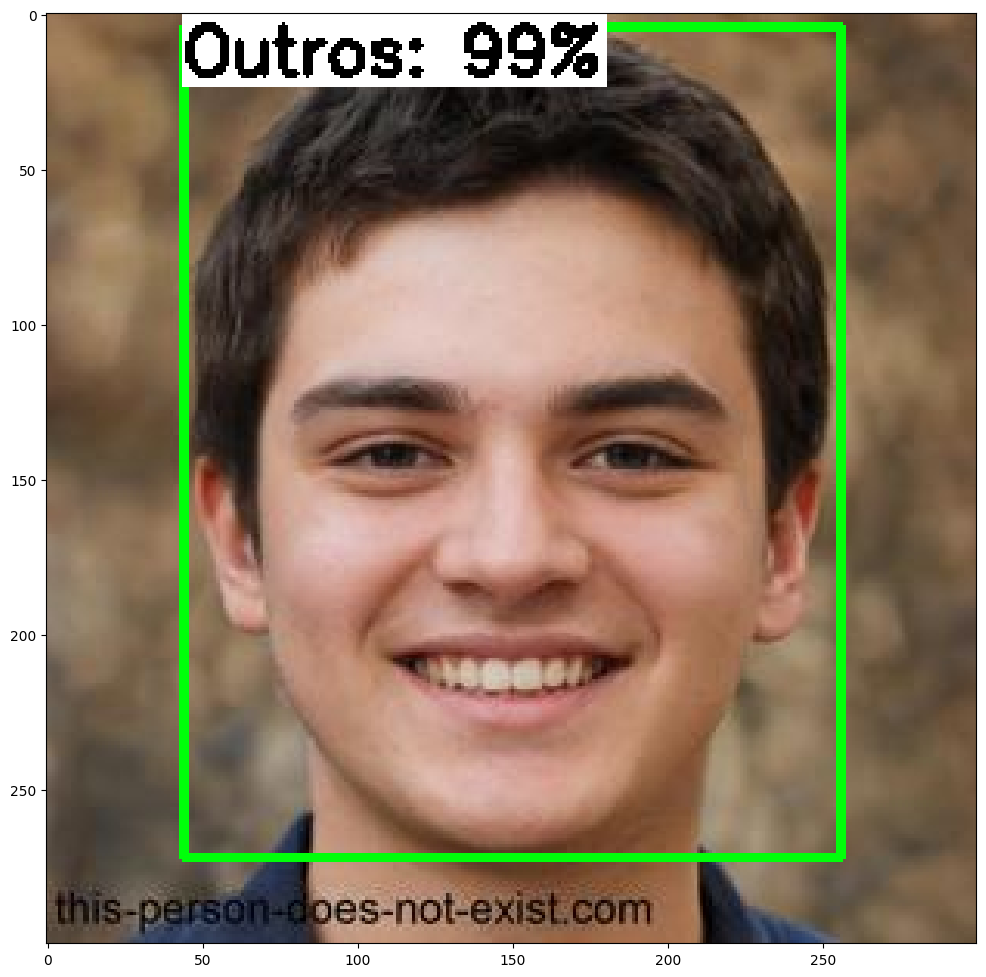

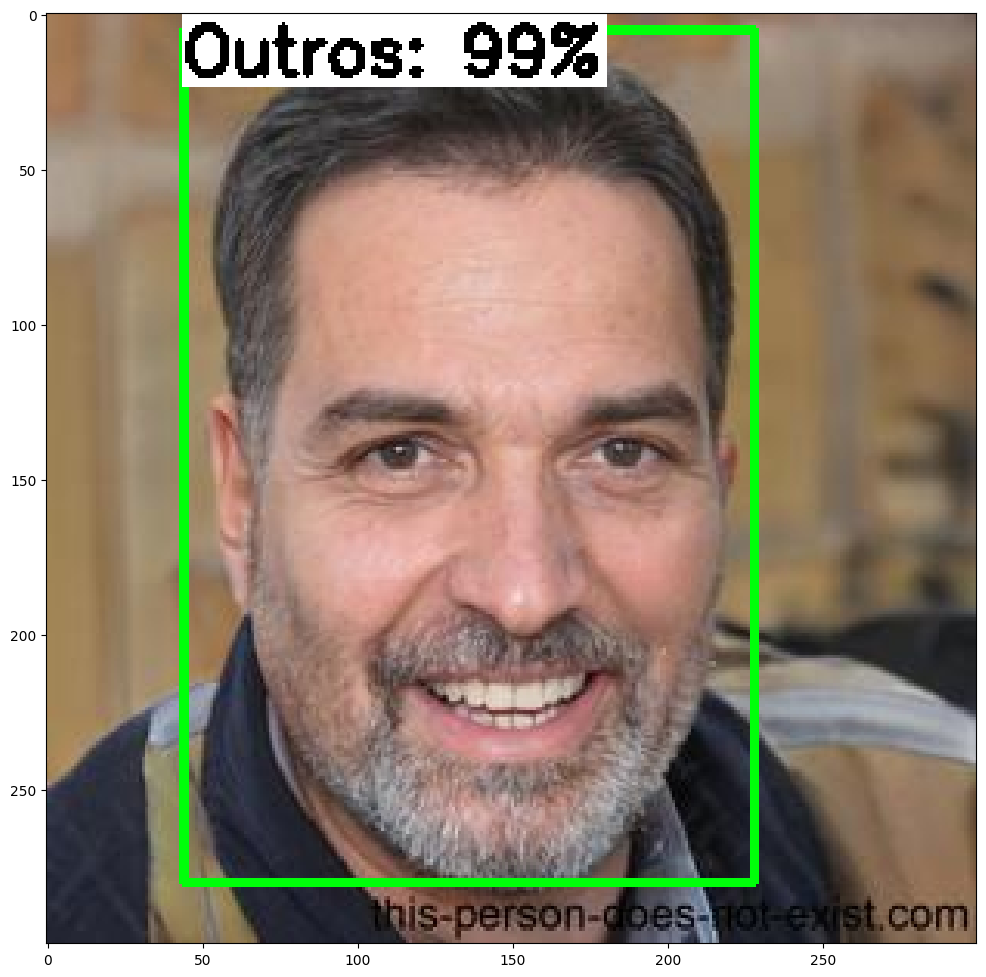

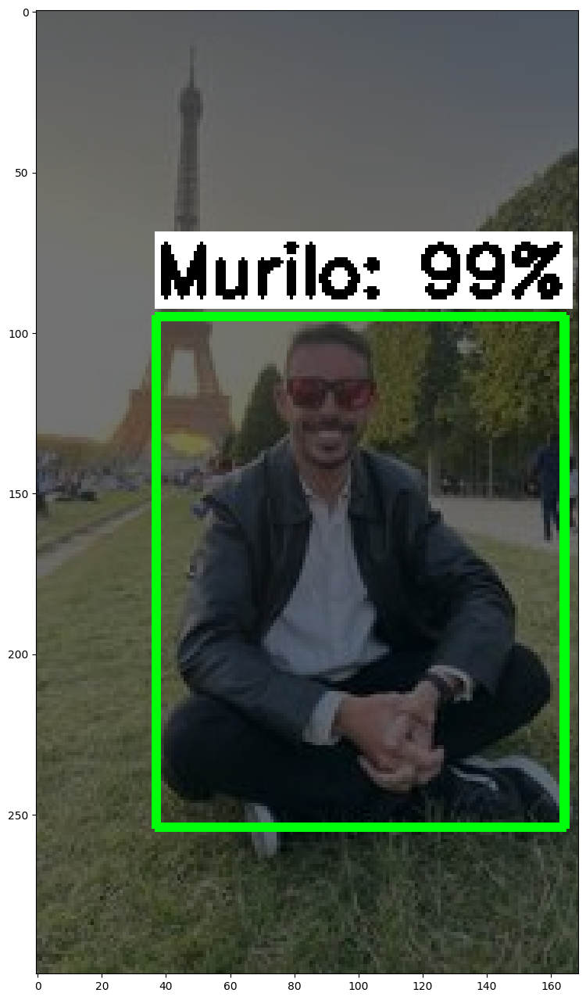

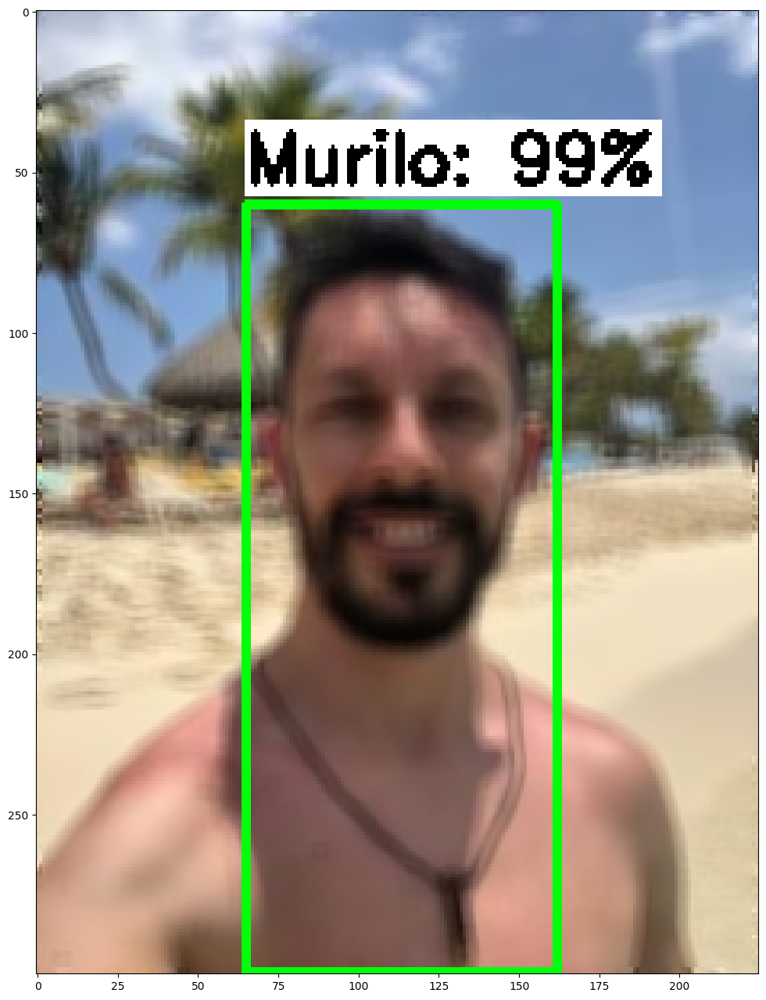

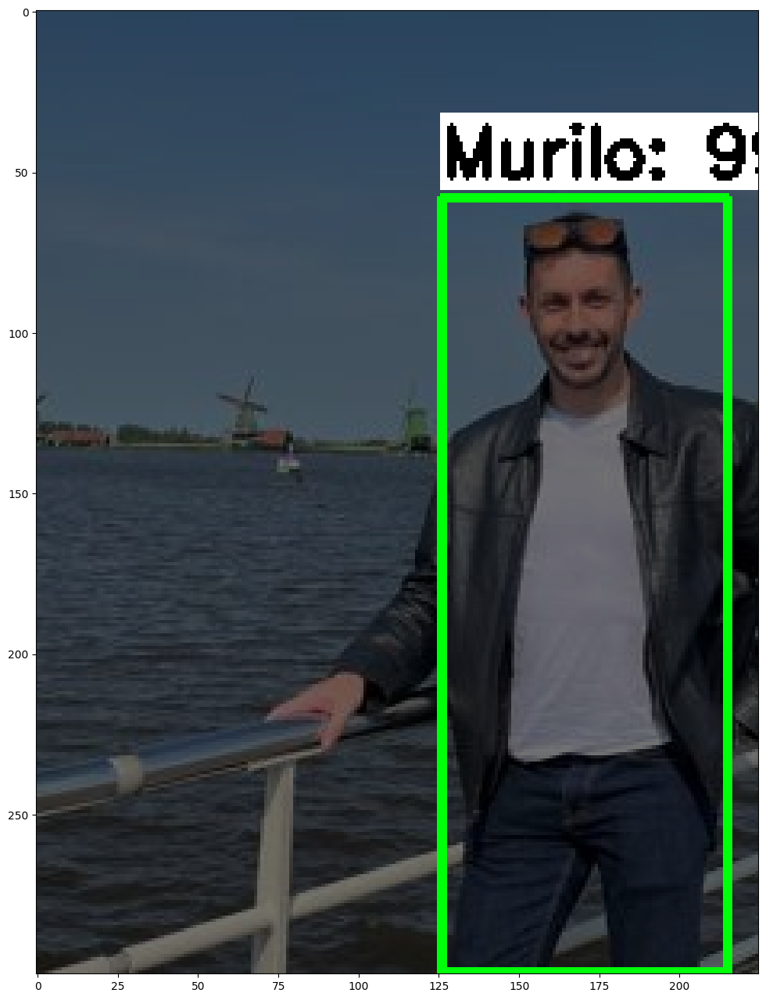

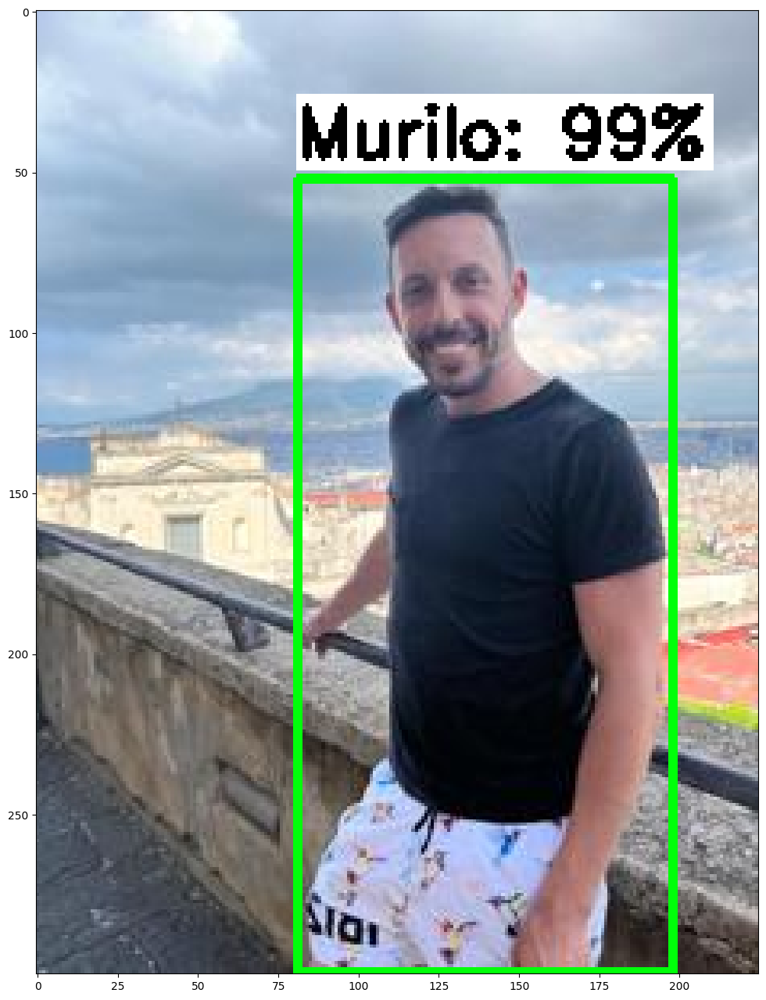

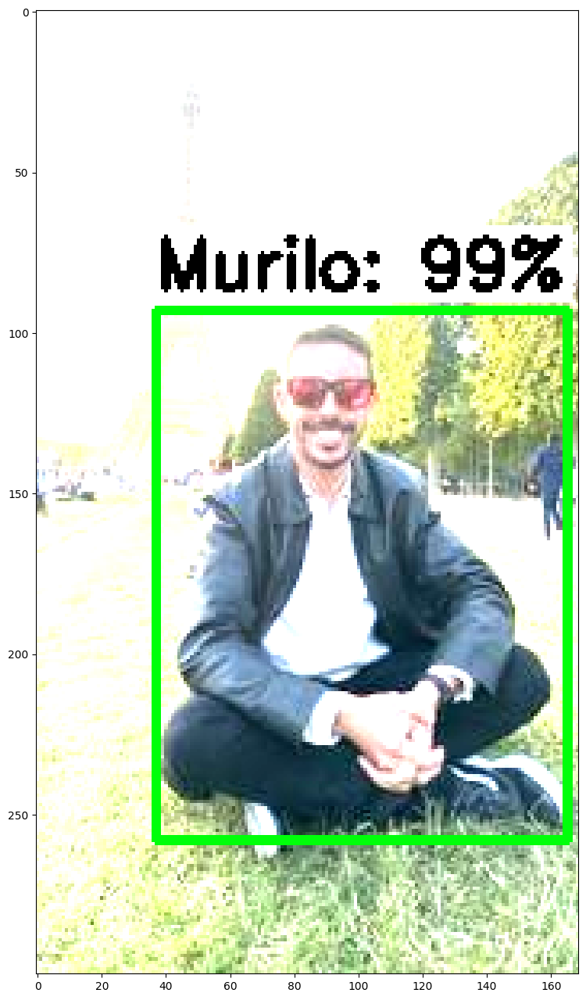

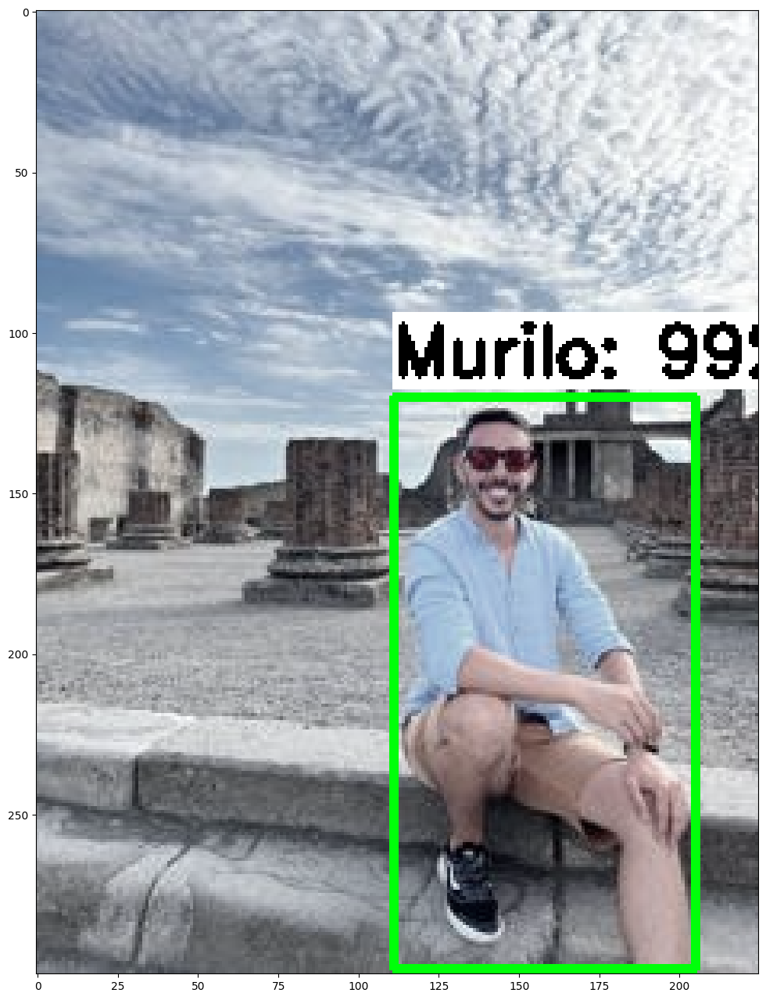

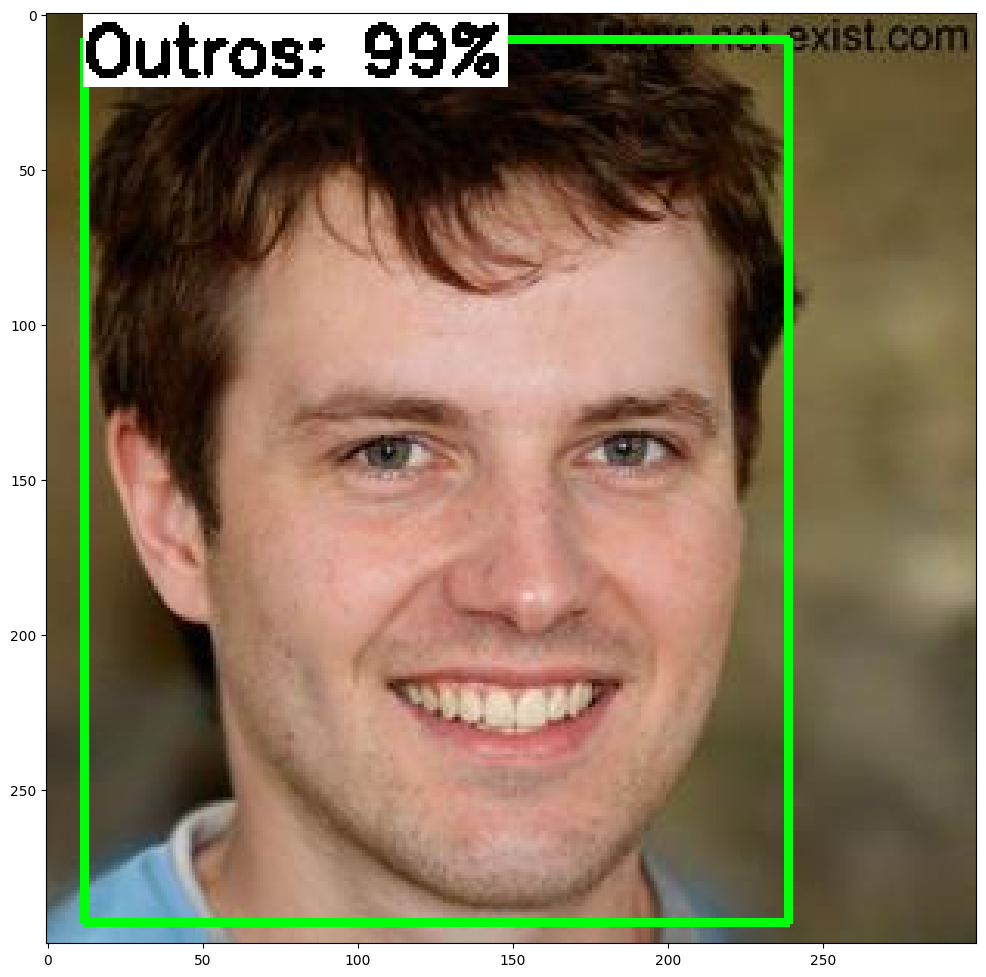

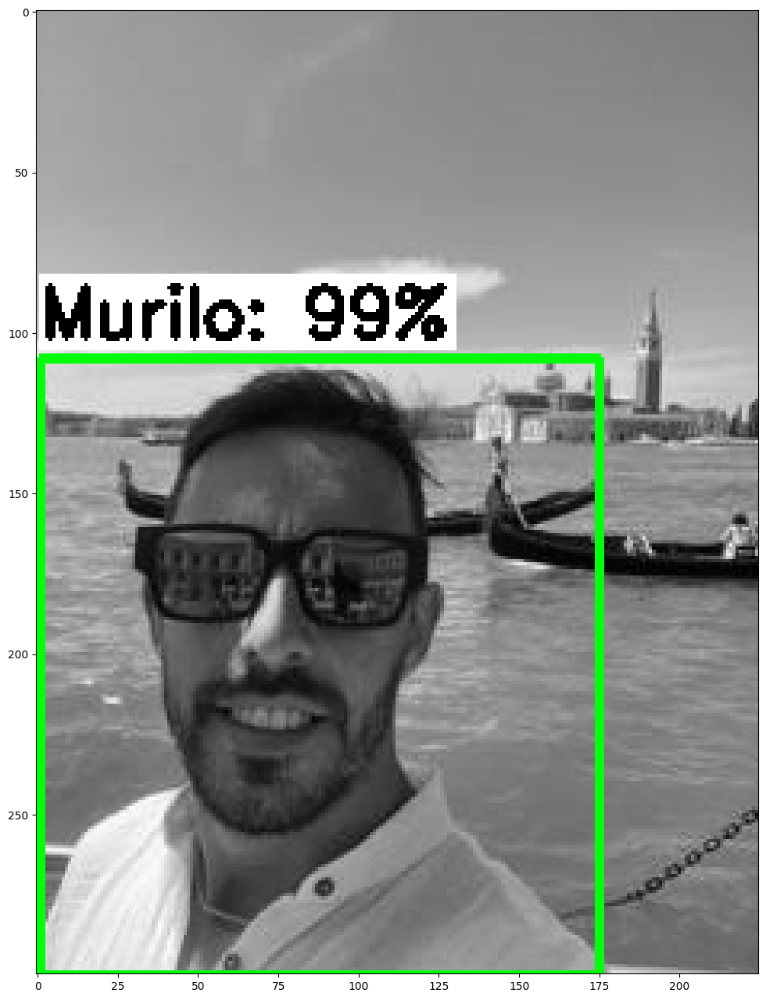

In [ ]:
# Configurar variáveis para executar o modelo do usuário
PATH_TO_IMAGES='/content/images/test'   # Caminho para a pasta de imagens de teste
PATH_TO_MODEL='/content/custom_model_lite/detect.tflite'   # Caminho para o arquivo de modelo .tflite
PATH_TO_LABELS='/content/labelmap.txt'   # Caminho para o arquivo labelmap.txt
min_conf_threshold=0.5   # Limiar de confiança (tente alterar para 0.01 se você não ver nenhum resultado de detecção)
images_to_test = 10   # Número de imagens para realizar a detecção

# Executar função de inferência!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

### 7.2 Calcular mAP

> Agora temos uma noção visual de como nosso modelo se comporta em imagens de teste, mas como podemos medir quantitativamente sua precisão?

> Um método popular para medir a precisão de um modelo de detecção de objetos é a "média da precisão média" (mAP).

> Basicamente, quanto maior a pontuação mAP, melhor o modelo é na detecção de objetos em imagens. Para saber mais sobre mAP, leia este [artigo da Roboflow](https://blog.roboflow.com/mean-average-precision/).

>Usaremos a ferramenta de cálculo de mAP disponível em https://github.com/Cartucho/mAP para determinar a pontuação mAP do nosso modelo.

> Primeiro, precisamos clonar o repositório e remover seus dados de exemplo existentes. Também baixaremos um script que escrevi para interagir com a calculadora.

In [ ]:
%%bash
git clone https://github.com/Cartucho/mAP /content/mAP
cd /content/mAP
rm input/detection-results/*
rm input/ground-truth/*
rm input/images-optional/*
wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py

Cloning into '/content/mAP'...
--2024-01-08 08:34:24--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5397 (5.3K) [text/plain]
Saving to: ‘calculate_map_cartucho.py’

     0K .....                                                 100% 49.0M=0s

2024-01-08 08:34:24 (49.0 MB/s) - ‘calculate_map_cartucho.py’ saved [5397/5397]



> A seguir, copiaremos as imagens e os dados de anotação da pasta teste para as pastas apropriadas dentro do repositório clonado.

> Estes serão usados como os "dados de verdade fundamental" com os quais os resultados de detecção do nosso modelo serão comparados.







In [ ]:
!cp /content/images/test/* /content/mAP/input/images-optional # Copiar imagens e arquivos xml
!mv /content/mAP/input/images-optional/*.xml /content/mAP/input/ground-truth/  # Mover arquivos xml para a pasta apropriada

> A ferramenta de cálculo espera que os dados de anotação estejam em um formato diferente do formato de arquivo .xml Pascal VOC que estamos usando.

> Felizmente, ela fornece um script fácil, `convert_gt_xml.py`, para converter para o formato .txt esperado.

In [ ]:
!python /content/mAP/scripts/extra/convert_gt_xml.py

Conversion completed!


> Certo, configuramos os dados de verdade fundamental, mas agora precisamos dos resultados reais de detecção do nosso modelo.

> Os resultados da detecção serão comparados aos dados de verdade fundamental para calcular a precisão do modelo em mAP.

> A função de inferência que definimos na Etapa 7.1 pode ser usada para gerar dados de detecção para todas as imagens na pasta teste.

> Usaremos da mesma forma que antes, exceto que desta vez diremos para salvar os resultados da detecção na pasta detection-results.

> Clique em Executar para rodar o seguinte bloco de código!

In [ ]:
# Configurar variáveis para executar a inferência, desta vez para obter resultados de detecção salvos como arquivos .txt
PATH_TO_IMAGES='/content/images/test'   # Caminho para a pasta de imagens de teste
PATH_TO_MODEL='/content/custom_model_lite/detect.tflite'   # Caminho para o arquivo de modelo .tflite
PATH_TO_LABELS='/content/labelmap.txt'   # Caminho para o arquivo labelmap.txt
PATH_TO_RESULTS='/content/mAP/input/detection-results' # Pasta para salvar os resultados da detecção
min_conf_threshold=0.1   # Limiar de confiança

# Usar todas as imagens na pasta de teste
image_list = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')
images_to_test = min(500, len(image_list)) # Se houver mais de 500 imagens na pasta, usar apenas 500

# Instruir a função para apenas salvar resultados e não exibir imagens
txt_only = True

# Executar função de inferência!
print('Iniciando inferência em %d imagens...' % images_to_test)
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test, PATH_TO_RESULTS, txt_only)
print('Inferência concluída!')


Iniciando inferência em 100 imagens...
Inferência concluída!


> Finalmente, vamos calcular o mAP! Um estilo popular para relatar o mAP é a métrica COCO para mAP @ 0.50:0.95.

> Basicamente, isso significa que o mAP é calculado em vários limiares de IoU entre 0.50 e 0.95, e então o resultado de cada limiar é médio para obter uma pontuação final de mAP. [Saiba mais aqui!](https://blog.roboflow.com/mean-average-precision/)

> `Evan Juras` escreveu um script para executar a ferramenta de cálculo em cada limiar de IoU, média dos resultados e relatar a pontuação final de precisão.

> Ele relata o mAP para cada classe e o mAP geral. Clique em Executar nos dois próximos blocos para calcular o mAP!

In [ ]:
%cd /content/mAP
!python calculate_map_cartucho.py --labels=/content/labelmap.txt

/content/mAP
Calculating mAP at 0.50 IoU threshold...
95.89% = Murilo AP 
88.08% = Outros AP 
mAP = 91.98%
Calculating mAP at 0.55 IoU threshold...
95.89% = Murilo AP 
88.08% = Outros AP 
mAP = 91.98%
Calculating mAP at 0.60 IoU threshold...
95.89% = Murilo AP 
88.08% = Outros AP 
mAP = 91.98%
Calculating mAP at 0.65 IoU threshold...
95.89% = Murilo AP 
88.08% = Outros AP 
mAP = 91.98%
Calculating mAP at 0.70 IoU threshold...
93.87% = Murilo AP 
85.13% = Outros AP 
mAP = 89.50%
Calculating mAP at 0.75 IoU threshold...
91.93% = Murilo AP 
83.35% = Outros AP 
mAP = 87.64%
Calculating mAP at 0.80 IoU threshold...
87.27% = Murilo AP 
81.41% = Outros AP 
mAP = 84.34%
Calculating mAP at 0.85 IoU threshold...
80.18% = Murilo AP 
81.41% = Outros AP 
mAP = 80.80%
Calculating mAP at 0.90 IoU threshold...
72.97% = Murilo AP 
70.80% = Outros AP 
mAP = 71.88%
Calculating mAP at 0.95 IoU threshold...
23.80% = Murilo AP 
31.56% = Outros AP 
mAP = 27.68%

***mAP Results***

Class		Average mAP @ 0.5:0.

> A pontuação relatada no final é a pontuação geral de mAP do seu modelo. Idealmente, ela deve estar acima de 50% (0,50).

> Se não estiver, você pode aumentar a precisão do seu modelo adicionando mais imagens ao seu conjunto de dados.

## 8.&nbsp;Implantar Modelo TensorFlow Lite







> Agora que seu modelo personalizado foi treinado e convertido para o formato TFLite, está pronto para ser baixado e implantado em um aplicativo!

> Esta seção mostra como baixar o modelo e fornece links para instruções de como implantá-lo no Raspberry Pi, no seu PC ou em outros dispositivos de borda.

### 8.1 Baixar modelo TFLite


> Execute as duas células a seguir para copiar os arquivos de mapa de etiquetas (labelmap) para a pasta do modelo, compactá-la em uma pasta zip e, em seguida, baixá-la.

> A pasta zip contém o modelo `detect.tflite` e os arquivos de mapa de etiquetas` labelmap.txt` que são necessários para executar o modelo em seu aplicativo.







In [ ]:
# Mova os arquivos de mapa de etiquetas e configuração de pipeline para a pasta do modelo TFLite e compacte-os
!cp /content/labelmap.txt /content/custom_model_lite
!cp /content/labelmap.pbtxt /content/custom_model_lite
!cp /content/models/mymodel/pipeline_file.config /content/custom_model_lite

%cd /content
!zip -r custom_model_lite.zip custom_model_lite

/content
  adding: custom_model_lite/ (stored 0%)
  adding: custom_model_lite/labelmap.pbtxt (deflated 30%)
  adding: custom_model_lite/detect.tflite (deflated 9%)
  adding: custom_model_lite/labelmap.txt (stored 0%)
  adding: custom_model_lite/saved_model/ (stored 0%)
  adding: custom_model_lite/saved_model/variables/ (stored 0%)
  adding: custom_model_lite/saved_model/variables/variables.data-00000-of-00001 (deflated 9%)
  adding: custom_model_lite/saved_model/variables/variables.index (deflated 78%)
  adding: custom_model_lite/saved_model/assets/ (stored 0%)
  adding: custom_model_lite/saved_model/saved_model.pb (deflated 91%)
  adding: custom_model_lite/pipeline_file.config (deflated 65%)


In [ ]:
from google.colab import files

files.download('/content/custom_model_lite.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> O arquivo `custom_model_lite.zip` contendo o modelo será baixado na sua pasta de Downloads.

> Está pronto para ser implantado no seu dispositivo!

### 8.2 Implantar modelo


> Modelos TensorFlow Lite podem ser executados em uma ampla variedade de hardware, incluindo PCs, sistemas embutidos e telefones.

> Esta seção fornece instruções sobre como implantar seu modelo TFLite em vários dispositivos.



### 8.3 Implantar no Raspberry Pi


> Modelos TFLite são excelentes para execução no Raspberry Pi, pois eles requerem menos poder de processamento do que os modelos regulares de visão do TensorFlow.

> O Pi pode executar modelos TFLite em tempo quase real.

> Para executar seu novo modelo no Raspberry Pi, você terá que instalar o TensorFlow Lite e preparar um ambiente Python para sua aplicação.

Uma vez que você tenha completado todos os passos do [vídeo referencia](https://youtu.be/aimSGOAUI8Y) [instruções do Classificador Binário em vídeo a serem adicionadas], mova o arquivo custom_model_lite.zip baixado desta sessão do Colab para o seu Raspberry Pi, na pasta ~/tflite1. Entre na pasta e descompacte-o usando o comando:







```
cd ~/tflite1
unzip custom_model_lite.zip
```

Then, run the image, video, or webcam TFLite detection program with the `--modeldir=fine_tuned_model_lite` argument. For example, to run the webcam detection program, issue:

```
python TFLite_detection_webcam.py --modeldir=custom_model_lite
```

> Uma janela aparecerá mostrando um feed ao vivo da sua webcam com caixas desenhadas ao redor dos objetos detectados em cada quadro.







### 8.4 Implantar no Windows, Linux ou macOS

> Siga as instruções vinculadas abaixo para configurar rapidamente o seu computador Windows, Linux ou macOS para executar modelos TFLite.

> Leva apenas alguns minutos! Executar um modelo no seu PC é bom para testar rapidamente o seu modelo com uma webcam.

> No entanto, tenha em mente que o Runtime do TFLite é otimizado para processadores de baixa potência e não utilizará toda a capacidade do processador do seu PC.



> Aqui estão os links para os guias de implantação para Windows, Linux e macOS:

> * Como Executar Modelos TensorFlow Lite no Windows

> * Link para o guia do Linux a ser adicionado (mas na verdade é o mesmo que para o Raspberry Pi)

> * Link para o guia do macOS a ser adicionado

### 8.5 Implantar em outros dispositivos de borda baseados em Linux

Instruções a serem adicionadas! 🐧


### 8.6 Implantar no Android


Instruções a serem adicionadas! 🤖







# Referências

<!-- Vídeo do YouTube -->
<p align="center">
  <a href="https://www.youtube.com/watch?v=aimSGOAUI8Y">
    <img src="https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/doc/YouTube_video1.JPG" alt="Link para o vídeo de Evan Juras no YouTube">
  </a>
</p>

<!-- Imagens do Google Drive -->
<div align="center">
  <img src="https://drive.google.com/uc?export=view&id=1oiL6jyZfvvvLl6pYniehkxmyIk-QPHOv" width="58%" />
  <img src="https://drive.google.com/uc?export=view&id=1g3HSeFeVaiTue2w-zxQSHEy-CZQlPzp7" width="58%" />
  <img src="https://drive.google.com/uc?export=view&id=1ncrB6fU6FU0jaqses30mrNrBfgxNY4oD" width="42%" />

---
https://www.youtube.com/watch?v=aimSGOAUI8Y

---

https://neptune.ai/blog/tensorflow-object-detection-api-best-practices-to-training-evaluation-deployment

---
https://github.com/tensorflow/models

---

</div>
